In [1]:
!pip install kaggle


In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("vipoooool/new-plant-diseases-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/new-plant-diseases-dataset


Classes disponibles : ['Tomato___Late_blight', 'Tomato___healthy', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Potato___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Strawberry___Leaf_scorch', 'Peach___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 'Apple___Black_rot', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Peach___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Pepper,_bell___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Potato___Late_blight', 'Tomato___Tomato_mosaic_virus', 'Strawberry___healthy', 'Apple___healthy', 'Grape___Black_rot', 'Potato___Early_blight', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Common_rust_', 'Grape___Esca_(Black_Measles)', 'Raspberry___healthy', 'Tomato__

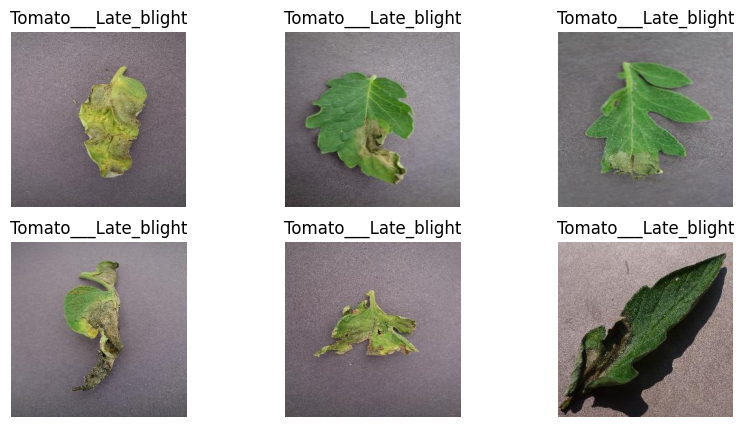

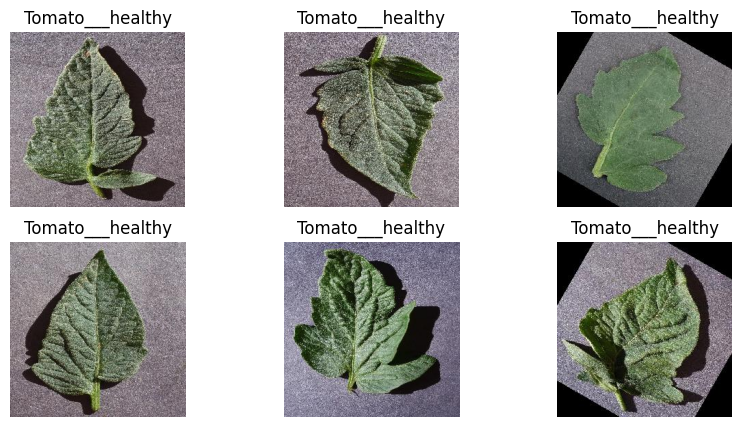

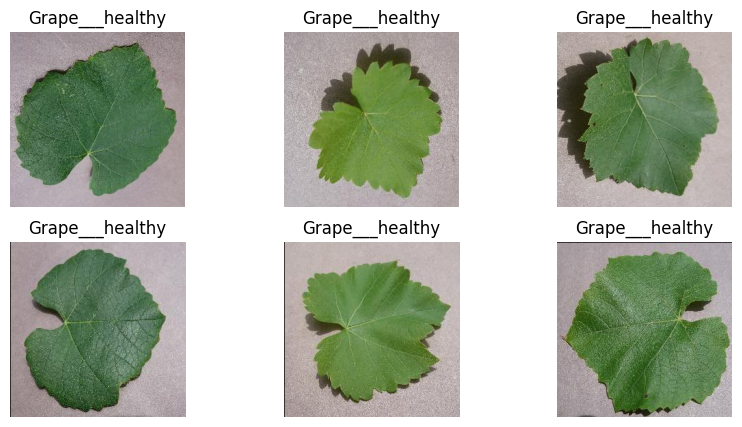

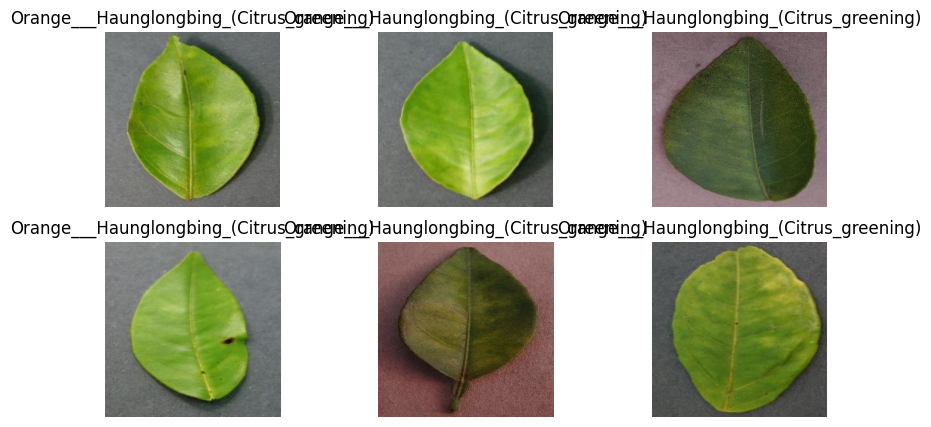

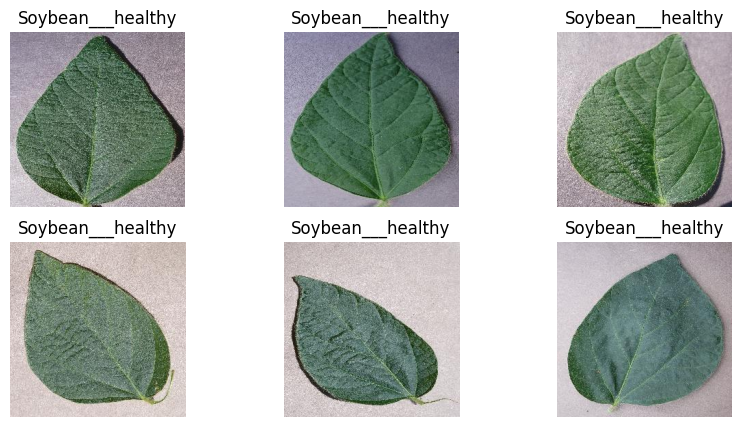

...

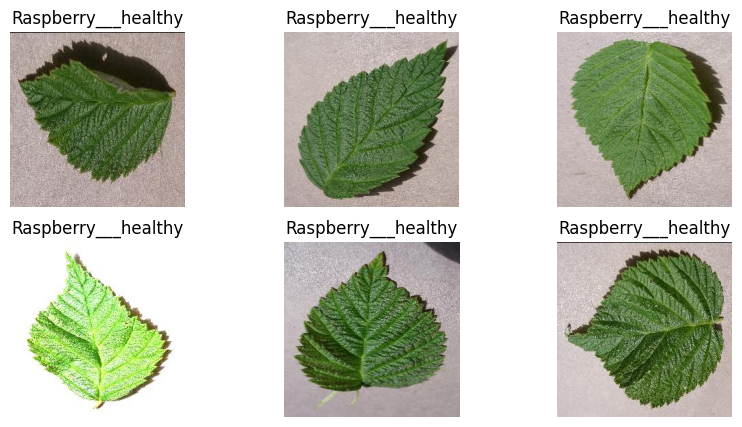

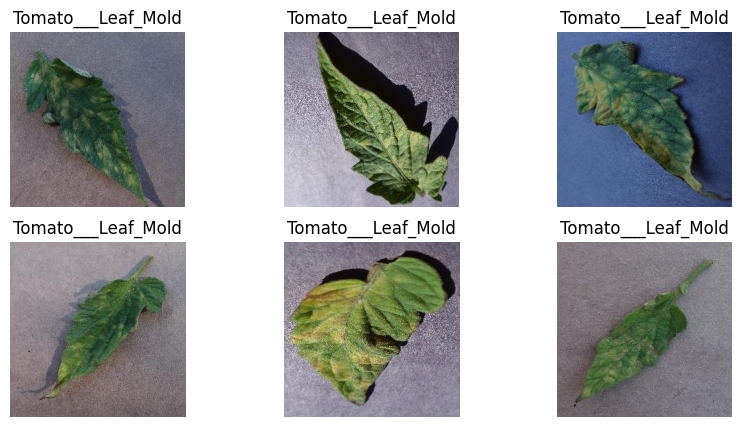

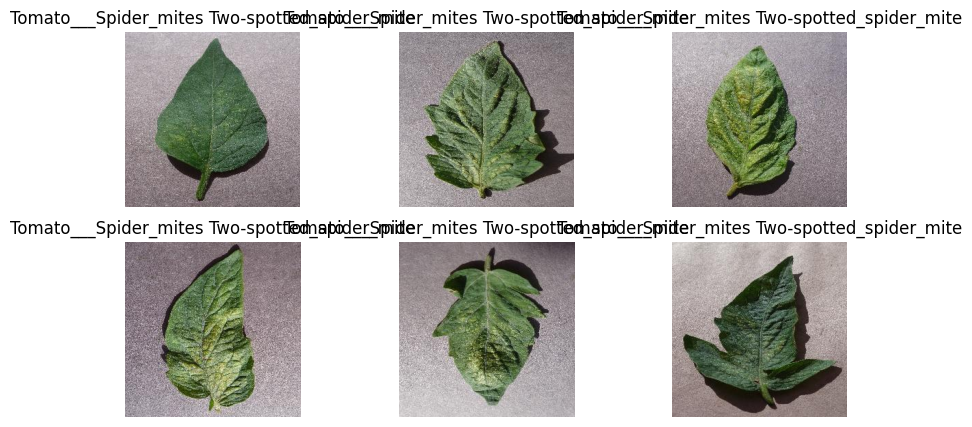

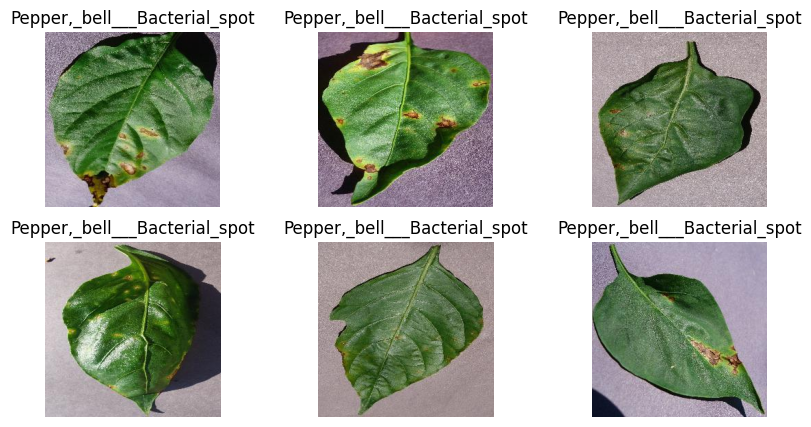

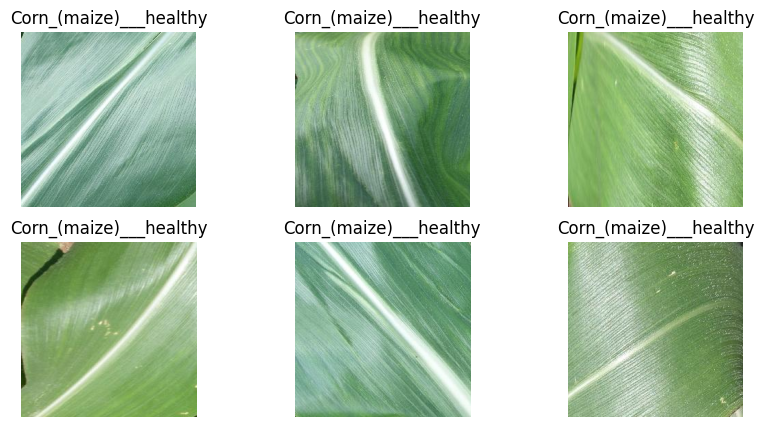

In [3]:
# Importer les bibliothèques nécessaires
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import random

base_path = "/root/.cache/kagglehub/datasets/vipoooool/new-plant-diseases-dataset/versions/2"  # Chemin du dataset



# Chemins vers les dossiers
# Dossiers pour l'entraînement, la validation et le test
train_path = os.path.join(path, "new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train")
valid_path = os.path.join(path, "new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid")
test_path = os.path.join(path, "test")

# Vérifier les classes disponibles
classes = os.listdir(train_path)
print("Classes disponibles :", classes)

# Afficher le nombre d'images par classe dans le dataset d'entraînement
train_counts = {cls: len(os.listdir(os.path.join(train_path, cls))) for cls in classes}
print("Nombre d'images par classe (train) :", train_counts)

# Fonction pour afficher quelques images
def show_sample_images(directory, class_name, num_images=6):
    plt.figure(figsize=(10, 5))
    img_dir = os.path.join(directory, class_name)
    images = random.sample(os.listdir(img_dir), num_images)

    for i, img_name in enumerate(images):
        img_path = os.path.join(img_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 3, i+1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis("off")

    plt.show()

# Afficher des images de chaque classe
for cls in classes:
    show_sample_images(train_path, cls)

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Définition des paramètres
img_size = 224  # Taille cible des images
batch_size = 32  # Nombre d'images par batch

# Générateurs de données avec augmentation pour l'entraînement
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalisation des pixels
    rotation_range=20,  # Rotation aléatoire jusqu'à 20 degrés
    width_shift_range=0.2,  # Décalage horizontal
    height_shift_range=0.2,  # Décalage vertical
    shear_range=0.2,  # Transformation en cisaillement
    zoom_range=0.2,  # Zoom aléatoire
    horizontal_flip=True,  # Flip horizontal
    fill_mode='nearest'  # Remplissage des pixels vides
)

# Générateur de validation (sans augmentation)
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Chargement des images avec les générateurs
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(150, 150),
    batch_size=batch_size,
    class_mode='categorical'  # 'binary' pour 2 classes, 'categorical' pour plus
)

val_generator = val_test_datagen.flow_from_directory(
    valid_path,
    target_size=(150, 150),
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_path,
    target_size=(150, 150),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Vérification de la structure des données
print("Classes :", train_generator.class_indices)


Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.
Found 33 images belonging to 1 classes.
Classes : {'Apple___Apple_scab': 0, 'Apple___Black_rot': 1, 'Apple___Cedar_apple_rust': 2, 'Apple___healthy': 3, 'Blueberry___healthy': 4, 'Cherry_(including_sour)___Powdery_mildew': 5, 'Cherry_(including_sour)___healthy': 6, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7, 'Corn_(maize)___Common_rust_': 8, 'Corn_(maize)___Northern_Leaf_Blight': 9, 'Corn_(maize)___healthy': 10, 'Grape___Black_rot': 11, 'Grape___Esca_(Black_Measles)': 12, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13, 'Grape___healthy': 14, 'Orange___Haunglongbing_(Citrus_greening)': 15, 'Peach___Bacterial_spot': 16, 'Peach___healthy': 17, 'Pepper,_bell___Bacterial_spot': 18, 'Pepper,_bell___healthy': 19, 'Potato___Early_blight': 20, 'Potato___Late_blight': 21, 'Potato___healthy': 22, 'Raspberry___healthy': 23, 'Soybean___healthy': 24, 'Squash___Powdery_mildew': 25, 'Strawberry___Lea

📂 Fichiers disponibles : ['.config', '.ipynb_checkpoints', 'ddddd.JPG', 'sample_data']
📷 Image analysée : ddddd.JPG


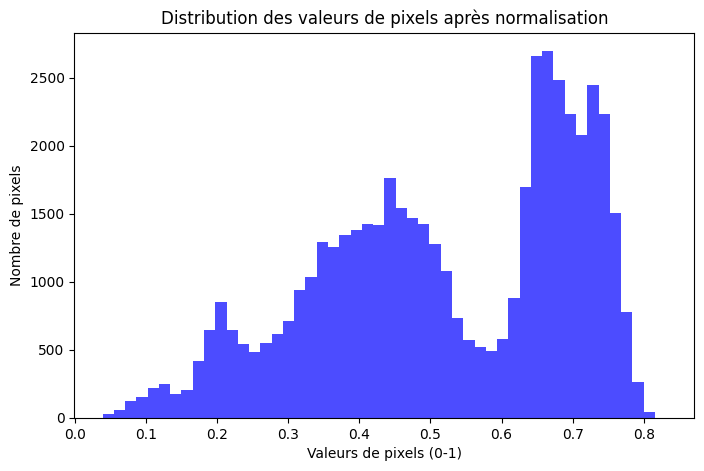

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Lister les fichiers pour trouver l'image uploadée
uploaded_files = os.listdir()  # Liste les fichiers dans le répertoire actuel
print("📂 Fichiers disponibles :", uploaded_files)

# Définir le nom du fichier image (remplace par le nom exact de ton image)
image_filename = "ddddd.JPG"  # ⚠️ Mets ici le nom exact du fichier

# Vérifier si l'image existe
if image_filename in uploaded_files:
    def check_pixel_distribution(image_path):
        """ Vérifie la distribution des pixels d'une image. """
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"⚠ Erreur : Impossible de charger l'image {image_path}.")
            return

        img = cv2.resize(img, (224, 224)) / 255.0  # Redimensionnement et normalisation

        plt.figure(figsize=(8, 5))
        plt.hist(img.ravel(), bins=50, color="blue", alpha=0.7)
        plt.title("Distribution des valeurs de pixels après normalisation")
        plt.xlabel("Valeurs de pixels (0-1)")
        plt.ylabel("Nombre de pixels")
        plt.show()

    # Analyser l’image
    print(f"📷 Image analysée : {image_filename}")
    check_pixel_distribution(image_filename)

else:
    print(f"⚠ Erreur : L'image '{image_filename}' n'a pas été trouvée. Vérifie son nom exact !")


# **📊 Interpretation of the Pixel Value Histogram**
**Significant peak at 0.0 (black)**

A large portion of the image is very dark (many black or near-black pixels).
Possible causes: black background, strong shadows, or transformation artifacts.

**Pixel distribution between 0.1 and 0.8**

The pixels are widely distributed, indicating visible details and good contrast.
Several secondary peaks suggest important variations in brightness (dark, medium, and bright areas).

**Low presence of pixels near 1.0 (pure white)**

The image does not have many very bright areas (no overexposure).
This can be beneficial if your dataset has a well-balanced brightness distribution.

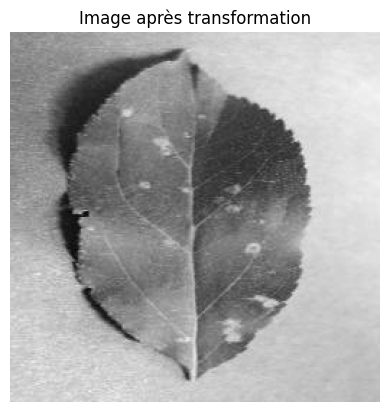

In [7]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("ddddd.JPG", cv2.IMREAD_GRAYSCALE) / 255.0
plt.imshow(img, cmap="gray")
plt.title("Image après transformation")
plt.axis("off")
plt.show()


# **🧐 Image Analysis After Transformation**

**Presence of Large Black Areas**

There are clearly visible black edges around the leaf, which explains the significant peak at 0 in the histogram.
These black areas often appear after rotating the image, when it is resized into a larger frame.

**Good Preservation of Leaf Details**

Despite the transformation, the details of the leaf remain visible, which is positive for disease analysis.
The texture and veins of the leaf are well preserved.

**Potential Issue for Model Training**

These black areas may disrupt the learning process of a deep learning model.
If other images do not have these black edges, the model may incorrectly learn that black borders are an important feature, which could skew classification.

**vérification de l'équilibrage de la data**

Répartition des images par classe dans le train set :

Apple___Apple_scab : 2016 images
Apple___Black_rot : 1987 images
Apple___Cedar_apple_rust : 1760 images
Apple___healthy : 2008 images
Blueberry___healthy : 1816 images
Cherry_(including_sour)___Powdery_mildew : 1683 images
Cherry_(including_sour)___healthy : 1826 images
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot : 1642 images
Corn_(maize)___Common_rust_ : 1907 images
Corn_(maize)___Northern_Leaf_Blight : 1908 images
Corn_(maize)___healthy : 1859 images
Grape___Black_rot : 1888 images
Grape___Esca_(Black_Measles) : 1920 images
Grape___Leaf_blight_(Isariopsis_Leaf_Spot) : 1722 images
Grape___healthy : 1692 images
Orange___Haunglongbing_(Citrus_greening) : 2010 images
Peach___Bacterial_spot : 1838 images
Peach___healthy : 1728 images
Pepper,_bell___Bacterial_spot : 1913 images
Pepper,_bell___healthy : 1988 images
Potato___Early_blight : 1939 images
Potato___Late_blight : 1939 images
Potato___healthy : 1824 images
Raspberry___h

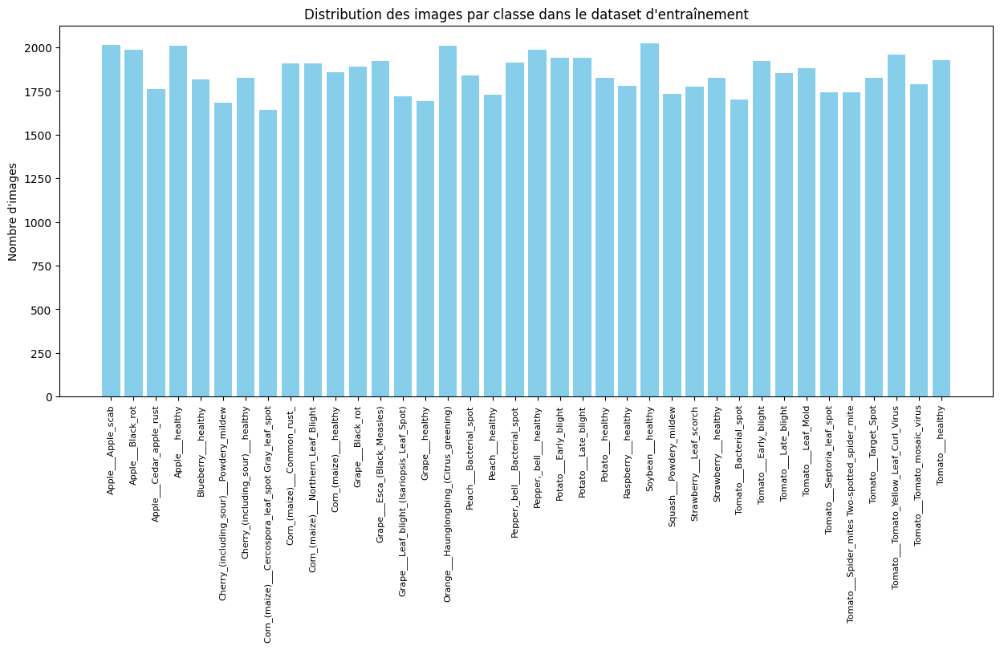

In [8]:
import os
import matplotlib.pyplot as plt

# Liste des classes
classes = ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy',
           'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy',
           'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_',
           'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot',
           'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy',
           'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy',
           'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight',
           'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew',
           'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight',
           'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot',
           'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot',
           'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']

# Fonction pour compter les images par classe
def count_images_per_class(directory, classes):
    class_counts = {class_name: 0 for class_name in classes}  # Initialise toutes les classes à 0
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            class_counts[class_name] = len(os.listdir(class_path))
    return class_counts

# Comptage des images dans le dossier train
train_counts = count_images_per_class(train_path, classes)

# Affichage des résultats
print("Répartition des images par classe dans le train set :\n")
for class_name, count in train_counts.items():
    print(f"{class_name} : {count} images")

# Visualisation avec un histogramme
plt.figure(figsize=(15, 6))
plt.bar(train_counts.keys(), train_counts.values(), color='skyblue')
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Nombre d'images")
plt.title("Distribution des images par classe dans le dataset d'entraînement")
plt.show()


**Conclusion:**

 dataset est assez bien équilibré, car les classes ont un nombre d'images relativement proche, entre 1642 et 2022 images.

# **Definition et Creation du modéle**

In [9]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Active le Mixed Precision pour accélérer sur GPU
tf.keras.mixed_precision.set_global_policy('mixed_float16')

# Paramètres globaux
BATCH_SIZE = 64  # Augmentation pour optimiser l'utilisation du GPU
NUM_CLASSES = 38  # Nombre de classes

# Chargement du modèle MobileNetV2 pré-entraîné
base_model = MobileNetV2(input_shape=(128, 128, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Gèle les poids pour un apprentissage rapide

# Construction du modèle CNN basé sur MobileNetV2
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation='softmax', dtype='float32')  # Sortie en float32 pour éviter les erreurs avec mixed_precision
])

# Compilation du modèle
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

# Génération des données avec prétraitement et augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

#modification de la taille pour meilleur temps d'execution pour l'entrainement du modéle

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(128, 128),  # Adapter à la taille attendue
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    valid_path,
    target_size=(128, 128),  # Adapter à la taille attendue
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)
model.summary()

# Callbacks pour accélérer l'entraînement
callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=3)
]



9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Found 56251 images belonging to 38 classes.
Found 3503 images belonging to 38 classes.


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128 (Functional)    │ (None, 4, 4, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         327,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 38)                  │           9,766 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,595,686 (9.90 MB)

 Trainable params: 337,702 (1.29 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

**Entraînement du modèle**

In [31]:
from google.colab import drive
import os


# Entraînement du modèle
cnn_history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=callbacks
)



save_dir = "/content/drive/My Drive/saved_models"
os.makedirs(save_dir, exist_ok=True)
model_path = os.path.join(save_dir, "model_modele2.h5")
try:
    model.save(model_path)
    print(f"Modèle sauvegardé sous : {model_path}")
except Exception as e:
    print(f"Erreur lors de la sauvegarde du modèle : {e}")

Epoch 1/20
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 394s 224ms/step - accuracy: 0.6862 - loss: 1.0532 - precision: 0.8422 - recall: 0.5395 - val_accuracy: 0.8233 - val_loss: 0.6163 - val_precision: 0.9160 - val_recall: 0.7191 - learning_rate: 1.0000e-04
Epoch 2/20
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 308s 175ms/step - accuracy: 0.7721 - loss: 0.7439 - precision: 0.8736 - recall: 0.6825 - val_accuracy: 0.8487 - val_loss: 0.5185 - val_precision: 0.9125 - val_recall: 0.7739 - learning_rate: 1.0000e-04
Epoch 3/20
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 312s 177ms/step - accuracy: 0.8026 - loss: 0.6297 - precision: 0.8818 - recall: 0.7294 - val_accuracy: 0.8521 - val_loss: 0.4619 - val_precision: 0.9125 - val_recall: 0.7979 - learning_rate: 1.0000e-04
Epoch 4/20
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 320s 176ms/step - accuracy: 0.8263 - loss: 0.5526 - precision: 0.8908 - recall: 0.7661 - val_accuracy: 0.8804 - val_loss: 0.4016 - val_precision: 0.9297 - val_recall: 0.8230 - learning_rate: 1.0000e-04
Epoch 5/20
1758/1758 ━━━

Modèle sauvegardé sous : /content/drive/My Drive/saved_models/model_modele2.h5


In [37]:

save_dir = "/content/drive/My Drive/saved_models"
os.makedirs(save_dir, exist_ok=True)
model_path = os.path.join(save_dir, "model_modele2.keras")
try:
    model.save(model_path)
    print(f"Modèle sauvegardé sous : {model_path}")
except Exception as e:
    print(f"Erreur lors de la sauvegarde du modèle : {e}")

Modèle sauvegardé sous : /content/drive/My Drive/saved_models/model_modele2.keras


In [34]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [38]:
from tensorflow.keras.models import load_model

# Chemin du modèle sauvegardé
model_path = "/content/drive/My Drive/saved_models/model_modele2.keras"

# Charger le modèle depuis le fichier
model1 = load_model(model_path)

# Afficher le résumé du modèle pour vérifier qu'il a bien été chargé
model1.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128 (Functional)    │ (None, 4, 4, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         327,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 38)                  │           9,766 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,933,394 (11.19 MB)

 Trainable params: 337,702 (1.29 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 337,708 (1.29 MB)

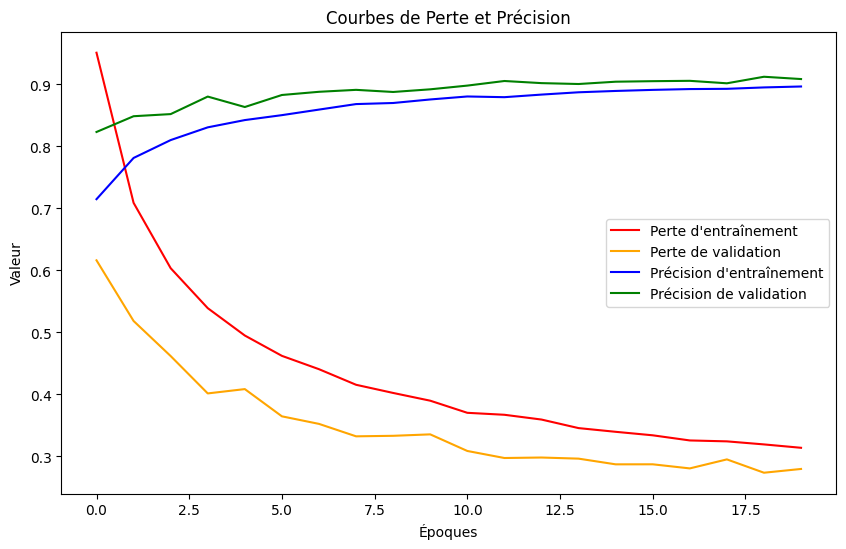

In [39]:
import matplotlib.pyplot as plt


# Visualiser la courbe de perte et précision dans le même graphique
plt.figure(figsize=(10, 6))

# Plot de la perte
plt.plot(cnn_history.history['loss'], label='Perte d\'entraînement', color='red')
plt.plot(cnn_history.history['val_loss'], label='Perte de validation', color='orange')

# Plot de la précision
plt.plot(cnn_history.history['accuracy'], label='Précision d\'entraînement', color='blue')
plt.plot(cnn_history.history['val_accuracy'], label='Précision de validation', color='green')

# Ajout des titres et des labels
plt.title('Courbes de Perte et Précision')
plt.xlabel('Époques')
plt.ylabel('Valeur')

# Affichage de la légende
plt.legend()

# Affichage du graphique
plt.show()


In [40]:
class_names = [
    "Apple___Apple_scab", "Apple___Black_rot", "Apple___Cedar_apple_rust", "Apple___healthy",
    "Blueberry___healthy", "Cherry_(including_sour)___Powdery_mildew", "Cherry_(including_sour)___healthy",
    "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot", "Corn_(maize)___Common_rust_",
    "Corn_(maize)___Northern_Leaf_Blight", "Corn_(maize)___healthy", "Grape___Black_rot",
    "Grape___Esca_(Black_Measles)", "Grape___Leaf_blight_(Isariopsis_Leaf_Spot)", "Grape___healthy",
    "Orange___Haunglongbing_(Citrus_greening)", "Peach___Bacterial_spot", "Peach___healthy",
    "Pepper,_bell___Bacterial_spot", "Pepper,_bell___healthy", "Potato___Early_blight",
    "Potato___Late_blight", "Potato___healthy", "Raspberry___healthy", "Soybean___healthy",
    "Squash___Powdery_mildew", "Strawberry___Leaf_scorch", "Strawberry___healthy",
    "Tomato___Bacterial_spot", "Tomato___Early_blight", "Tomato___Late_blight",
    "Tomato___Leaf_Mold", "Tomato___Septoria_leaf_spot", "Tomato___Spider_mites Two-spotted_spider_mite",
    "Tomato___Target_Spot", "Tomato___Tomato_Yellow_Leaf_Curl_Virus", "Tomato___Tomato_mosaic_virus",
    "Tomato___healthy"
]


In [41]:

# Fonction pour prédire la classe et le nom de la maladie
def predict_disease(model, img_path, input_size, class_names):
    """
    Prédit la maladie à partir de l'image donnée.

    Args:
        model: Le modèle entraîné.
        img_path: Chemin de l'image à prédire.
        input_size: Taille de l'image attendue par le modèle.
        class_names: Liste des noms des classes (maladies).

    Returns:
        Le nom de la maladie prédite.
    """
    try:
        # Charger l'image et la redimensionner
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=input_size)
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_array = tf.expand_dims(img_array, axis=0)  # Ajouter une dimension pour le batch
        img_array = img_array / 255.0  # Normaliser les pixels entre 0 et 1

        # Faire la prédiction
        prediction = model.predict(img_array)

        # Trouver l'indice de la classe avec la probabilité la plus élevée
        class_index = tf.argmax(prediction, axis=1).numpy()[0]

        # Retourner le nom de la classe (maladie)
        return class_names[class_index]

    except Exception as e:
        return f"Erreur lors de la prédiction : {e}"

# Exemple de prédiction
img_path = "ddddd.JPG"  # Remplace par le chemin de ton image
result = predict_disease(model1, img_path, (128, 128), class_names)
print(f"Résultat de la prédiction : {result}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Résultat de la prédiction : Apple___Cedar_apple_rust


In [45]:
# une photo de pepperhealthy d'apres google
# Fonction pour prédire la classe et le nom de la maladie
def predict_disease(model, img_path, input_size, class_names):
    """
    Prédit la maladie à partir de l'image donnée.

    Args:
        model: Le modèle entraîné.
        img_path: Chemin de l'image à prédire.
        input_size: Taille de l'image attendue par le modèle.
        class_names: Liste des noms des classes (maladies).

    Returns:
        Le nom de la maladie prédite.
    """
    try:
        # Charger l'image et la redimensionner
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=input_size)
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_array = tf.expand_dims(img_array, axis=0)  # Ajouter une dimension pour le batch
        img_array = img_array / 255.0  # Normaliser les pixels entre 0 et 1

        # Faire la prédiction
        prediction = model.predict(img_array)

        # Trouver l'indice de la classe avec la probabilité la plus élevée
        class_index = tf.argmax(prediction, axis=1).numpy()[0]

        # Retourner le nom de la classe (maladie)
        return class_names[class_index]

    except Exception as e:
        return f"Erreur lors de la prédiction : {e}"

# Exemple de prédiction
img_path = "pph.jpg"  # Remplace par le chemin de ton image
result = predict_disease(model1, img_path, (128, 128), class_names)
print(f"Résultat de la prédiction : {result}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Résultat de la prédiction : Pepper,_bell___healthy


In [50]:
# une photo de tomate malade mais il ne detecte pas la vrai maladie  d'apres google
# Fonction pour prédire la classe et le nom de la maladie
def predict_disease(model, img_path, input_size, class_names):
    """
    Prédit la maladie à partir de l'image donnée.

    Args:
        model: Le modèle entraîné.
        img_path: Chemin de l'image à prédire.
        input_size: Taille de l'image attendue par le modèle.
        class_names: Liste des noms des classes (maladies).

    Returns:
        Le nom de la maladie prédite.
    """
    try:
        # Charger l'image et la redimensionner
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=input_size)
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_array = tf.expand_dims(img_array, axis=0)  # Ajouter une dimension pour le batch
        img_array = img_array / 255.0  # Normaliser les pixels entre 0 et 1

        # Faire la prédiction
        prediction = model.predict(img_array)

        # Trouver l'indice de la classe avec la probabilité la plus élevée
        class_index = tf.argmax(prediction, axis=1).numpy()[0]

        # Retourner le nom de la classe (maladie)
        return class_names[class_index]

    except Exception as e:
        return f"Erreur lors de la prédiction : {e}"

# Exemple de prédiction
img_path = "t2n.jpg"  # Remplace par le chemin de ton image
result = predict_disease(model1, img_path, (128, 128), class_names)
print(f"Résultat de la prédiction : {result}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Résultat de la prédiction : Tomato___Early_blight


In [43]:

# Fonction pour prédire la classe et le nom de la maladie
def predict_disease(model, img_path, input_size, class_names):
    """
    Prédit la maladie à partir de l'image donnée.

    Args:
        model: Le modèle entraîné.
        img_path: Chemin de l'image à prédire.
        input_size: Taille de l'image attendue par le modèle.
        class_names: Liste des noms des classes (maladies).

    Returns:
        Le nom de la maladie prédite.
    """
    try:
        # Charger l'image et la redimensionner
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=input_size)
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_array = tf.expand_dims(img_array, axis=0)  # Ajouter une dimension pour le batch
        img_array = img_array / 255.0  # Normaliser les pixels entre 0 et 1

        # Faire la prédiction
        prediction = model.predict(img_array)

        # Trouver l'indice de la classe avec la probabilité la plus élevée
        class_index = tf.argmax(prediction, axis=1).numpy()[0]

        # Retourner le nom de la classe (maladie)
        return class_names[class_index]

    except Exception as e:
        return f"Erreur lors de la prédiction : {e}"

# Exemple de prédiction
img_path = "CR1.JPG"  # Remplace par le chemin de ton image
result = predict_disease(model1, img_path, (128, 128), class_names)
print(f"Résultat de la prédiction : {result}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Résultat de la prédiction : Corn_(maize)___Common_rust_
